In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
import cv2
from collections import Counter
import matplotlib.patches as patches
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN

In [2]:
def intersection_over_union(boxes_preds, boxes_labels, box_format="midpoint"):
    """
    Calculates intersection over union

    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct Labels of Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes (x,y,w,h) or (x1,y1,x2,y2)

    Returns:
        tensor: Intersection over union for all examples
    """

    # Slicing idx:idx+1 in order to keep tensor dimensionality
    # Doing ... in indexing if there would be additional dimensions
    # Like for Yolo algorithm which would have (N, S, S, 4) in shape
    if box_format == "midpoint":
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2

    elif box_format == "corners":
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4]
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    # Need clamp(0) in case they do not intersect, then we want intersection to be 0
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)
    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))

    return intersection / (box1_area + box2_area - intersection + 1e-6)

In [3]:
def mean_average_precision(
    pred_boxes, true_boxes, iou_threshold=0.5, box_format="midpoint", num_classes=20
):
    """
    Calculates mean average precision 

    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones 
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes

    Returns:
        float: mAP value across all classes given a specific IoU threshold 
    """

    # list storing all AP for respective classes
    average_precisions = []

    # used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets,
        # and only add the ones that belong to the
        # current class c
        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get
        # for each training example, so let's say img 0 has 3,
        # img 1 has 5 then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary
        # and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)
        
        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same
            # training idx as detection
            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (total_true_bboxes + epsilon)
        precisions = TP_cumsum / (TP_cumsum + FP_cumsum + epsilon)
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)


In [5]:
import torch

def nms(bboxes, iou_threshold, threshold, box_format="corners"):
    """
    Does Non Max Suppression given bboxes

    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU) 
        box_format (str): "midpoint" or "corners" used to specify bboxes

    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """

    assert type(bboxes) == list

    bboxes = [box for box in bboxes if box[1] > threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format,
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms

In [6]:
MODEL_PATH = 'model.pth'

In [7]:
device = torch.device('cpu')


# load a model pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)
    
num_classes = 2  # 

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the trained weights
weights = MODEL_PATH #'/kaggle/working/' + 'bestmodel_method_new.pth'

checkpoint = torch.load(weights,map_location=device)
model.load_state_dict(checkpoint['state_dict'])
model.eval()

x = model.to(device)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Argume

In [30]:
DIR_TEST = '/kaggle/input/zju-leaper/ZJU-Leaper/ZJU-Leaper/Images/'
val_df = pd.read_csv('/kaggle/input/fabrik-8-notebook/VALID_DATASET.csv')
test_images = val_df.sample(16)['filename'].to_numpy()

In [8]:
def get_dimensions(xmin, ymin, xmax, ymax):
  width = xmax - xmin
  height = ymax - ymin
  return xmin, ymin, width, height

In [9]:
def applyNMS(bboxes, scores, pred_labels, iou_threshold=0.2, threshold = 0.7, box_format='corners'):
    formatted_bboxes = list(zip(pred_labels, scores, bboxes))
    formatted_input =  [[x[0], x[1], *x[2]] for x in formatted_bboxes]
    return nms(formatted_input, iou_threshold, threshold, box_format)

In [10]:
def bbLabelFormat(xmin, ymin, rect_width):
    if ymin > 50:
        return (xmin, ymin)
    else:
        if xmin + rect_width > 462:
            return (xmin - rect_width - 10, ymin+20)
        return (xmin + 10, ymin + 20)
  

In [11]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches


def draw_bounding_boxes(image_name, model):
    image = cv2.imread(image_name)
    orig_image = image.copy()

    image = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB).astype(np.float64)
    image /= 255.0
    image = np.transpose(image, (2, 0, 1)).astype(np.float64)
    image = torch.tensor(image, dtype=torch.float)
    image = torch.unsqueeze(image, 0)

    with torch.no_grad():
        outputs = model(image)

    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]

    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        pred_classes = [i for i in outputs[0]['labels'].numpy()]

        non_suppressed_boxes = applyNMS(boxes, scores, pred_classes)
        print(non_suppressed_boxes)

        fig, ax = plt.subplots()
        ax.imshow(orig_image, interpolation='nearest', aspect='equal')

        for j in range(len(non_suppressed_boxes)):
            box = non_suppressed_boxes[j]
            xmin, ymin, width, height = get_dimensions(
                int(box[2]), int(box[3]), int(box[4]), int(box[5]))
            rect = patches.Rectangle(
                (xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor="none")
            ax.add_patch(rect)

            rx, ry = rect.get_xy()
            cx = rx + rect.get_width() / 2.0
            cy = ry + rect.get_height() / 2.0
            ax.annotate('Defect ' + str(np.around(box[1] * 100, decimals=1)) + '%', (bbLabelFormat(xmin, ymin, rect.get_width())),
                        color='white', fontsize=12,
                        bbox=dict(facecolor='red', edgecolor='black', linewidth=0.8, alpha=0.7))

        ax.set_axis_off()
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.show()

    print(f"Image {image_name} processed...")
    return ax



[]


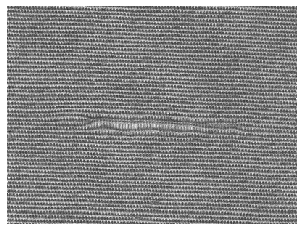

Image pick.png processed...
iVBORw0KGgoAAAANSUhEUgAAASEAAADZCAYAAABvq4bbAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjUuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8qNh9FAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nFz9d3Ck53mmi18d0Gh0IzVyzjkDkyMncTgcDpNIUaRIyRJlhWNKR5Z3fXZVu3vO8Z5y1ZY3+Oz6eGWvFS1RYo7DyQkTkQc5Z3QjNBqdgM7d6N8f8vuU9FOVqlgsEhx0f9/7PuG+r1vz1ltvxW02GyUlJWxtbeHz+YhGo1gsFpxOJ9nZ2YRCIeLxOF6vl6ysLIxGI0ajkYKCAnp7eyktLQVgc3OTjY0Njh07xv3798nLy6OlpYXJyUm2t7cpKirC7/cTDodpa2ujt7eXQCDAE088wfT0NOvr65w4cYL19XVmZmY4cOAACQkJ9PT0UFVVxdraGjMzM2RlZVFZWcnc3Bwmk4k333yT//bf/hvV1dW88sor/Pf//t/xeDy8+uqrrKysMDw8zI9//GPeeustsrOz2b9/Py6Xi8nJSYqLizEYDJSWlpKWlobD4WB7e5t4PM7x48d5/Pgx6+vr7N+/H5vNxvLyMi+88AJOp5ORkRHOnz/P2toa8XicjIwM7t69S1FREWlpaayurmI0GsnPz2dycpLCwkIsFgsOh4OUlBSi0Sibm5tUVlYyOzuLy+UiIyODuro6FhcXCYVCZGZmsrW1RSQSoaSkhFAoxPz8PHl5eczOzlJUVIRer0ej0XDv3j2ampqwWq0sLi7S3NzM0tISbrcbs9mM0WhkYWGBtrY23G63fCdOp5PR0VEOHTqEx+PBZrORkpKCwWDA7Xazu7tLYWEh0WgUt9uNwWAgKysLp9OJ2WzGbDbj9/vRaDSsra3J77y9vc3m5iapqano9Xri8TiR

In [12]:
import base64
import io


res = draw_bounding_boxes("pick.png", model)
#save image
res.figure.savefig('result5.png', bbox_inches='tight', pad_inches=0)
buffer = io.BytesIO()
res.figure.savefig(buffer, format='png', bbox_inches='tight', pad_inches=0)
buffer.seek(0)

# Convert the buffer to a base64 string
image_base64 = base64.b64encode(buffer.read()).decode()

print(image_base64)


In [34]:
rows = 4
fig, ax = plt.subplots(nrows=rows, ncols=4, figsize=(100, 100))
count = 0
for i in range(len(test_images)):
 
    image_name = DIR_TEST + test_images[i]
    image = cv2.imread(image_name)
    orig_image = image.copy()

    image = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB).astype(np.float64)
    
    image /= 255.0
   
    image = np.transpose(image, (2, 0, 1)).astype(np.float64)
   
    image = torch.tensor(image, dtype=torch.float)
    # add batch dimension
    image = torch.unsqueeze(image, 0)
    
    with torch.no_grad():
        outputs = model(image)
    
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]

   
    if len(outputs[0]['boxes']) != 0:
    
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        pred_classes = [i for i in outputs[0]['labels'].numpy()]
        
        non_suppressed_boxes = applyNMS(boxes, scores, pred_classes)
        print(non_suppressed_boxes)

        for j in range(len(non_suppressed_boxes)):

            box = non_suppressed_boxes[j]
            xmin, ymin, width, height = get_dimensions(int(box[2]), int(box[3]), int(box[4]), int(box[5]))
            rect = patches.Rectangle((xmin, ymin), width, height, linewidth=6, edgecolor='r', facecolor="none")
            
            rx, ry = rect.get_xy()
            cx = rx + rect.get_width()/2.0
            cy = ry + rect.get_height()/2.0
            ax.ravel()[i].add_patch(rect) 
            t = ax.ravel()[i].annotate('Defect ' + str(np.around(box[1]*100, decimals=1)) + '%', (bbLabelFormat(xmin, ymin, rect.get_width())), 
                                       color='white', fontsize=32 ,fontweight='bold',
                                       bbox=dict(facecolor='red', edgecolor='black', linewidth=2, alpha=0.7))
  
    ax.ravel()[i].imshow(orig_image, interpolation='nearest', aspect='equal')
    ax.ravel()[i].set_axis_off()
    plt.subplots_adjust(wspace=None, hspace=None)   
 

    print(f"Image {i+1} done...")
    print('-'*50)
print('TEST PREDICTIONS COMPLETE')

Image 1 done...
--------------------------------------------------
[[1, 0.89167213, 195.99738, 381.91324, 336.31155, 512.0]]
Image 2 done...
--------------------------------------------------
[]
Image 3 done...
--------------------------------------------------
[[1, 0.9859158, 9.234121, 0.0, 422.67773, 236.50783], [1, 0.97531646, 267.5537, 0.16295409, 461.7347, 107.098045]]
Image 4 done...
--------------------------------------------------
[[1, 0.9247073, 358.0844, 329.24756, 506.60855, 421.3968]]
Image 5 done...
--------------------------------------------------
[[1, 0.9106206, 291.30313, 128.07553, 499.15295, 508.2717]]
Image 6 done...
--------------------------------------------------
[[1, 0.8792396, 337.43265, 348.00528, 435.8807, 445.25168]]
Image 7 done...
--------------------------------------------------
[[1, 0.96036935, 6.463711, 229.527, 179.5923, 512.0], [1, 0.9539895, 165.13324, 144.5765, 249.22469, 218.25885]]
Image 8 done...
-----------------------------------------------